### Decision Tree
- Supervised learning used on both Regression / classification tasks
- predicts value from the decision rule inferred from the features of data
- If-then-else decision rule
- Deeper depth of tree - complex model

- Easy to understand / interpret
- Easy to visualize
- Do not need a lot of data processing steps
- Can handle Numerical / categorical data 

In [1]:
import pandas as pd
import numpy as np
import graphviz
import multiprocessing

%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use(['seaborn-whitegrid'])

In [2]:
from sklearn.datasets import load_iris, load_wine, load_breast_cancer
from sklearn.datasets import load_boston, load_diabetes
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline

#### Iris data 

In [3]:
iris = load_iris()
iris_df = pd.DataFrame(data=iris.data, columns=iris.feature_names)
iris_df['target'] = iris.target

In [4]:
iris_df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


In [5]:
wine = load_wine()
wine_df = pd.DataFrame(data=wine.data, columns=wine.feature_names)
wine_df['target'] = wine.target

In [6]:
wine_df

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740.0,2
174,13.40,3.91,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750.0,2
175,13.27,4.28,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835.0,2
176,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.0,2


#### Breast cancer data

In [7]:
cancer = load_breast_cancer()

In [8]:
cancer_df = pd.DataFrame(cancer.data, columns=cancer.feature_names)
cancer_df['target'] = cancer.target

#### Boston housing data

In [9]:
boston = load_boston()

C:\Users\wk789\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np


        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California housing 

In [10]:
boston_df = pd.DataFrame(boston.data, columns=boston.feature_names)
boston_df['target'] = boston.target

#### Diabetes data

In [11]:
diabetes = load_diabetes()

In [12]:
diabetes_df = pd.DataFrame(diabetes.data, columns=diabetes.feature_names)
diabetes_df['target'] = diabetes.target

### Classification - ```DecisionTreeClassifier()```

- Two arrays X, y as input
- X : [n_samples, n_features]
- y : [n_samples]

In [13]:
X = [[0, 0], [1, 1]]
y = [0, 1]

model = tree.DecisionTreeClassifier()
model = model.fit(X ,y)

In [14]:
model.predict([[2., 2.]])

array([1])

In [15]:
model.predict_proba([[2., 2.]])

array([[0., 1.]])

### Iris training 

##### Cross validation

In [16]:
# Training without preprocessing

model = DecisionTreeClassifier()
cross_val_score(estimator=model,
                X=iris.data, y=iris.target,
                cv=5, n_jobs=multiprocessing.cpu_count())


array([0.96666667, 0.96666667, 0.9       , 1.        , 1.        ])

In [17]:
# Training with preprocessing 

model = make_pipeline(
    StandardScaler(),
    DecisionTreeClassifier())

In [18]:
cross_val_score(estimator=model,
                X=iris.data, y=iris.target,
                cv=5, n_jobs=multiprocessing.cpu_count())

array([0.96666667, 0.96666667, 0.9       , 1.        , 1.        ])

 Decision Tree learns the _rule_ itself, so preprocessing doesn't affect the performance much

#### Visualization 

In [19]:
model = DecisionTreeClassifier()
model.fit(iris.data, iris.target)

DecisionTreeClassifier()

In [20]:
# Visualization using text 

r = tree.export_text(decision_tree=model,
                     feature_names=iris.feature_names)
print(r)

|--- petal width (cm) <= 0.80
|   |--- class: 0
|--- petal width (cm) >  0.80
|   |--- petal width (cm) <= 1.75
|   |   |--- petal length (cm) <= 4.95
|   |   |   |--- petal width (cm) <= 1.65
|   |   |   |   |--- class: 1
|   |   |   |--- petal width (cm) >  1.65
|   |   |   |   |--- class: 2
|   |   |--- petal length (cm) >  4.95
|   |   |   |--- petal width (cm) <= 1.55
|   |   |   |   |--- class: 2
|   |   |   |--- petal width (cm) >  1.55
|   |   |   |   |--- petal length (cm) <= 5.45
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- petal length (cm) >  5.45
|   |   |   |   |   |--- class: 2
|   |--- petal width (cm) >  1.75
|   |   |--- petal length (cm) <= 4.85
|   |   |   |--- sepal length (cm) <= 5.95
|   |   |   |   |--- class: 1
|   |   |   |--- sepal length (cm) >  5.95
|   |   |   |   |--- class: 2
|   |   |--- petal length (cm) >  4.85
|   |   |   |--- class: 2



[Text(0.5, 0.9166666666666666, 'X[3] <= 0.8\ngini = 0.667\nsamples = 150\nvalue = [50, 50, 50]'),
 Text(0.4230769230769231, 0.75, 'gini = 0.0\nsamples = 50\nvalue = [50, 0, 0]'),
 Text(0.5769230769230769, 0.75, 'X[3] <= 1.75\ngini = 0.5\nsamples = 100\nvalue = [0, 50, 50]'),
 Text(0.3076923076923077, 0.5833333333333334, 'X[2] <= 4.95\ngini = 0.168\nsamples = 54\nvalue = [0, 49, 5]'),
 Text(0.15384615384615385, 0.4166666666666667, 'X[3] <= 1.65\ngini = 0.041\nsamples = 48\nvalue = [0, 47, 1]'),
 Text(0.07692307692307693, 0.25, 'gini = 0.0\nsamples = 47\nvalue = [0, 47, 0]'),
 Text(0.23076923076923078, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1]'),
 Text(0.46153846153846156, 0.4166666666666667, 'X[3] <= 1.55\ngini = 0.444\nsamples = 6\nvalue = [0, 2, 4]'),
 Text(0.38461538461538464, 0.25, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3]'),
 Text(0.5384615384615384, 0.25, 'X[2] <= 5.45\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1]'),
 Text(0.46153846153846156, 0.08333333333333333, 'gini 

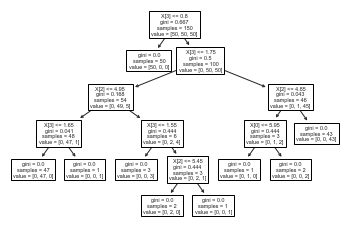

In [21]:
# Visualization using plot tree
tree.plot_tree(model)

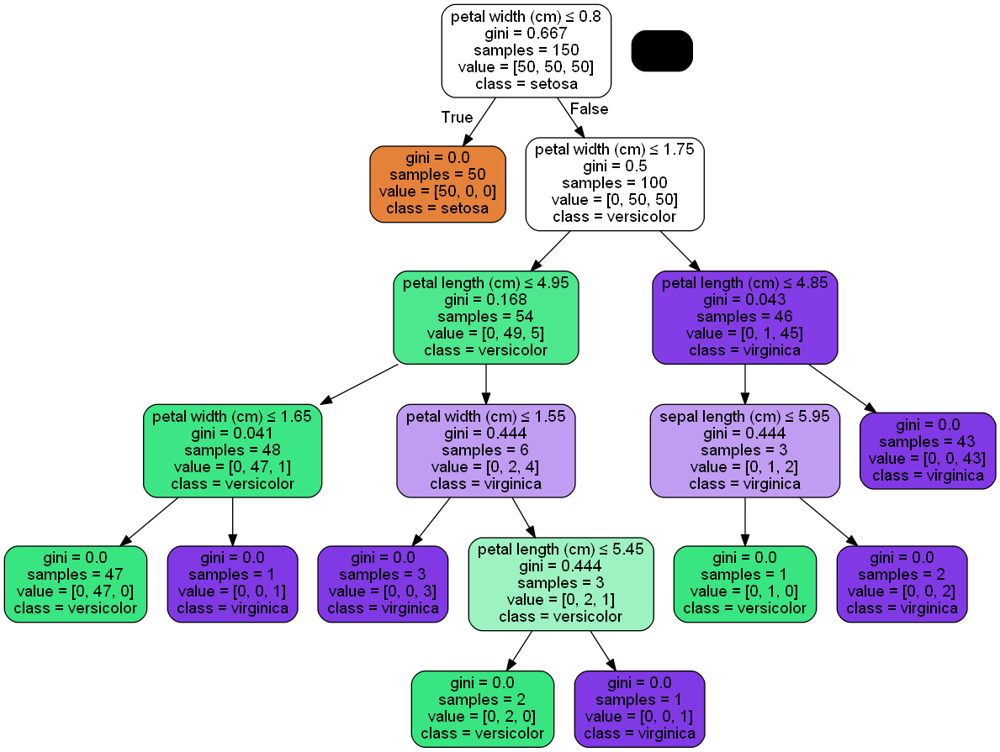

In [28]:
# Visualization using graphviz
import pydotplus
from IPython.display import Image

dot_data = tree.export_graphviz(decision_tree=model,
                                feature_names=iris.feature_names,
                                class_names=iris.target_names,
                                filled=True, rounded=True,
                                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [38]:
n_classes = 1
plot_colors='ryb'
plot_step = 0.02

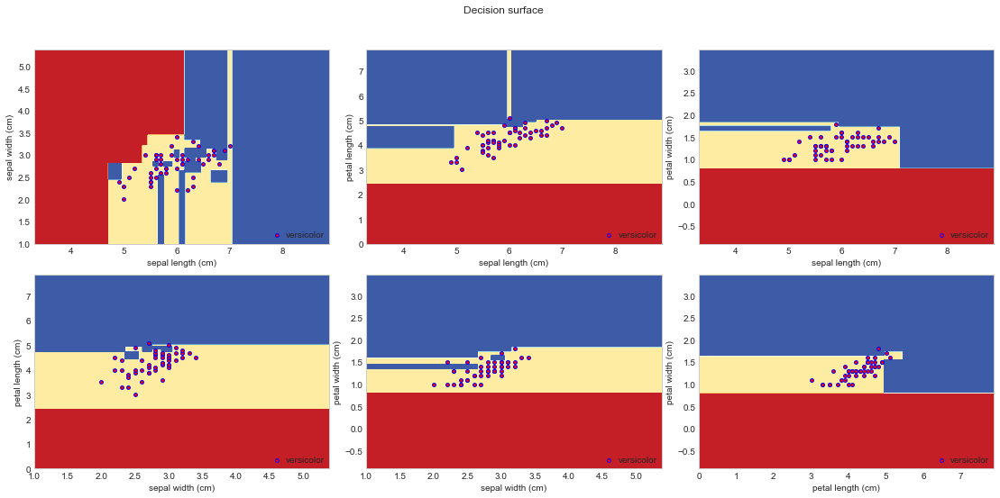

In [43]:
# Visualization of decision boundaries
plt.figure(figsize=(16, 8))
for pairidx, pair in enumerate([[0, 1], [0, 2], [0, 3],
                                [1, 2], [1, 3], [2, 3]]):
    X = iris.data[:, pair]
    y = iris.target
    
    model = DecisionTreeClassifier()
    model = model.fit(X, y)
    
    plt.subplot(2, 3, pairidx+1)
    
    x_min, x_max = X[:, 0].min()-1, X[:, 0].max()+1
    y_min, y_max = X[:, 1].min()-1, X[:, 1].max()+1
    
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)
    
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)
    
    plt.xlabel(iris.feature_names[pair[0]])
    plt.ylabel(iris.feature_names[pair[1]])
    
    for i, color in zip(range(n_classes), plot_colors):
        idx= np.where(y==1)
        plt.scatter(X[idx, 0], X[idx, 1], c=color, label=iris.target_names[1],
                    cmap=plt.cm.RdYlBu, edgecolors='b', s=15)
        
    plt.suptitle('Decision surface')
    plt.legend(loc='lower right', borderpad=0, handletextpad=0)
    plt.axis('tight')

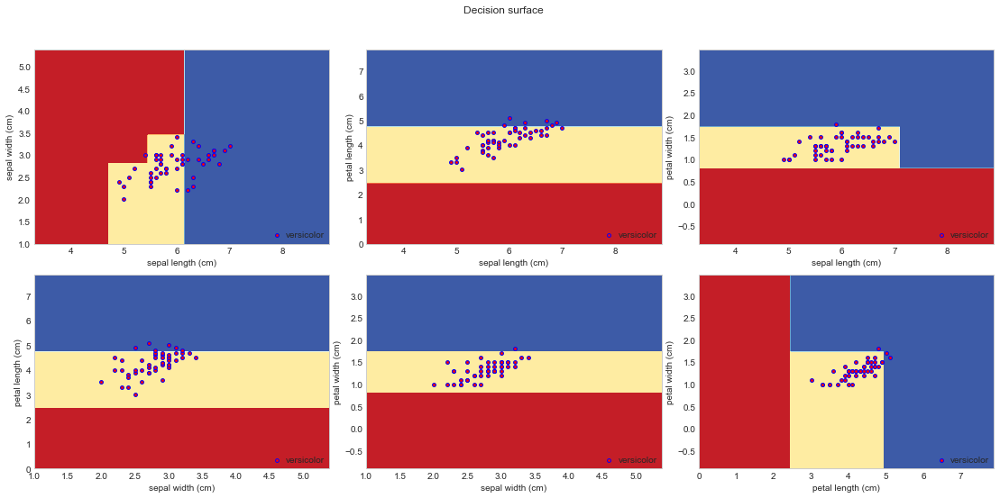

In [45]:
# Visualization of decision boundaries
plt.figure(figsize=(16, 8))
for pairidx, pair in enumerate([[0, 1], [0, 2], [0, 3],
                                [1, 2], [1, 3], [2, 3]]):
    X = iris.data[:, pair]
    y = iris.target
    
    model = DecisionTreeClassifier(max_depth=3)
    model = model.fit(X, y)
    
    plt.subplot(2, 3, pairidx+1)
    
    x_min, x_max = X[:, 0].min()-1, X[:, 0].max()+1
    y_min, y_max = X[:, 1].min()-1, X[:, 1].max()+1
    
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)
    
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)
    
    plt.xlabel(iris.feature_names[pair[0]])
    plt.ylabel(iris.feature_names[pair[1]])
    
    for i, color in zip(range(n_classes), plot_colors):
        idx= np.where(y==1)
        plt.scatter(X[idx, 0], X[idx, 1], c=color, label=iris.target_names[1],
                    cmap=plt.cm.RdYlBu, edgecolors='b', s=15)
        
    plt.suptitle('Decision surface')
    plt.legend(loc='lower right', borderpad=0, handletextpad=0)
    plt.axis('tight')

#### Wine data

In [46]:
model = DecisionTreeClassifier()

In [47]:
cross_val_score(model,
                X=wine.data, y=wine.target,
                cv=5,
                n_jobs=multiprocessing.cpu_count())

array([0.94444444, 0.80555556, 0.94444444, 0.91428571, 0.85714286])

In [48]:
# After preprocessing

model = make_pipeline(StandardScaler(),
                      DecisionTreeClassifier())

In [49]:
cross_val_score(model,
                X=wine.data, y=wine.target,
                cv=5,
                n_jobs=multiprocessing.cpu_count())

array([0.88888889, 0.83333333, 0.94444444, 0.91428571, 0.85714286])

In [50]:
# Visualization 
model = DecisionTreeClassifier()
model.fit(wine.data, wine.target)

DecisionTreeClassifier()

In [51]:
r = tree.export_text(decision_tree=model,
                     feature_names=wine.feature_names)
print(r)

|--- proline <= 755.00
|   |--- od280/od315_of_diluted_wines <= 2.11
|   |   |--- hue <= 0.94
|   |   |   |--- flavanoids <= 1.58
|   |   |   |   |--- class: 2
|   |   |   |--- flavanoids >  1.58
|   |   |   |   |--- class: 1
|   |   |--- hue >  0.94
|   |   |   |--- flavanoids <= 0.56
|   |   |   |   |--- class: 2
|   |   |   |--- flavanoids >  0.56
|   |   |   |   |--- class: 1
|   |--- od280/od315_of_diluted_wines >  2.11
|   |   |--- flavanoids <= 0.80
|   |   |   |--- class: 2
|   |   |--- flavanoids >  0.80
|   |   |   |--- alcohol <= 13.17
|   |   |   |   |--- class: 1
|   |   |   |--- alcohol >  13.17
|   |   |   |   |--- magnesium <= 98.50
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- magnesium >  98.50
|   |   |   |   |   |--- class: 0
|--- proline >  755.00
|   |--- flavanoids <= 2.17
|   |   |--- malic_acid <= 2.08
|   |   |   |--- class: 1
|   |   |--- malic_acid >  2.08
|   |   |   |--- class: 2
|   |--- flavanoids >  2.17
|   |   |--- color_intensity <= 3.43
|  

[Text(0.5657894736842105, 0.9166666666666666, 'X[12] <= 755.0\ngini = 0.658\nsamples = 178\nvalue = [59, 71, 48]'),
 Text(0.34210526315789475, 0.75, 'X[11] <= 2.115\ngini = 0.492\nsamples = 111\nvalue = [2, 67, 42]'),
 Text(0.21052631578947367, 0.5833333333333334, 'X[10] <= 0.935\ngini = 0.227\nsamples = 46\nvalue = [0, 6, 40]'),
 Text(0.10526315789473684, 0.4166666666666667, 'X[6] <= 1.58\ngini = 0.049\nsamples = 40\nvalue = [0, 1, 39]'),
 Text(0.05263157894736842, 0.25, 'gini = 0.0\nsamples = 39\nvalue = [0, 0, 39]'),
 Text(0.15789473684210525, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0]'),
 Text(0.3157894736842105, 0.4166666666666667, 'X[6] <= 0.565\ngini = 0.278\nsamples = 6\nvalue = [0, 5, 1]'),
 Text(0.2631578947368421, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1]'),
 Text(0.3684210526315789, 0.25, 'gini = 0.0\nsamples = 5\nvalue = [0, 5, 0]'),
 Text(0.47368421052631576, 0.5833333333333334, 'X[6] <= 0.795\ngini = 0.117\nsamples = 65\nvalue = [2, 61, 2]'),
 Text(0.42105

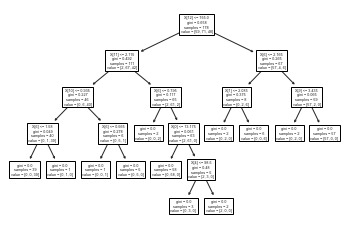

In [52]:
tree.plot_tree(model)

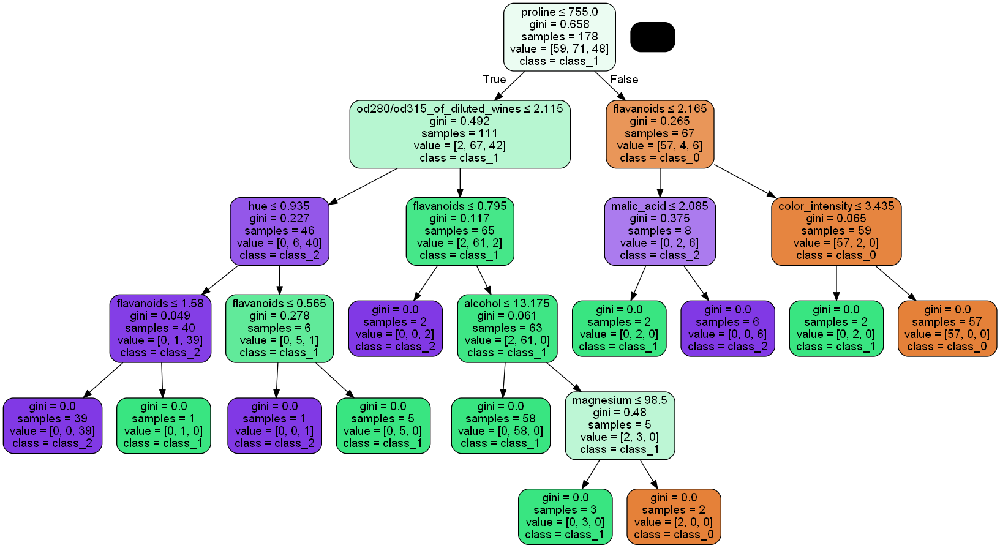

In [54]:
dot_data = tree.export_graphviz(decision_tree=model,
                                feature_names=wine.feature_names,
                                class_names=wine.target_names,
                                filled=True, rounded=True,
                                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [57]:
n_classes = 3
plot_colors = 'ryb'
plot_step = 0.02

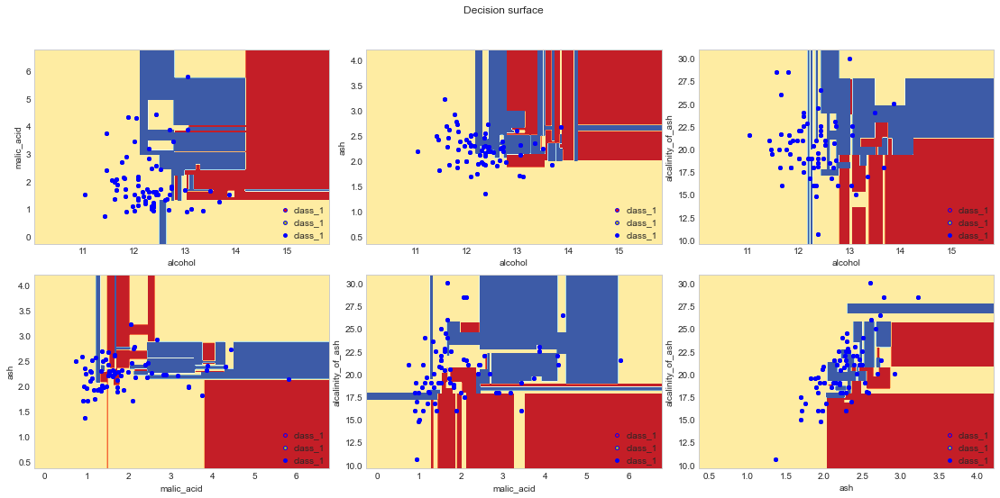

In [63]:
plt.figure(figsize=(16, 8))
for pairidx, pair in enumerate([[0, 1], [0, 2], [0, 3],
                                [1, 2], [1, 3], [2, 3]]):
    X = wine.data[:, pair]
    y = wine.target
    
    model = DecisionTreeClassifier()
    model = model.fit(X, y)
    
    plt.subplot(2, 3, pairidx+1)
    
    x_min, x_max = X[:, 0].min()-1, X[:, 0].max()+1
    y_min, y_max = X[:, 1].min()-1, X[:, 1].max()+1
    
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)
    
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)
    
    plt.xlabel(wine.feature_names[pair[0]])
    plt.ylabel(wine.feature_names[pair[1]])
    
    for i, color in zip(range(n_classes), plot_colors):
        idx= np.where(y==1)
        plt.scatter(X[idx, 0], X[idx, 1], c=color, label=wine.target_names[1],
                    cmap=plt.cm.RdYlBu, edgecolors='b', s=15)
        
    plt.suptitle('Decision surface')
    plt.legend(loc='lower right', borderpad=0, handletextpad=0)
    plt.axis('tight')

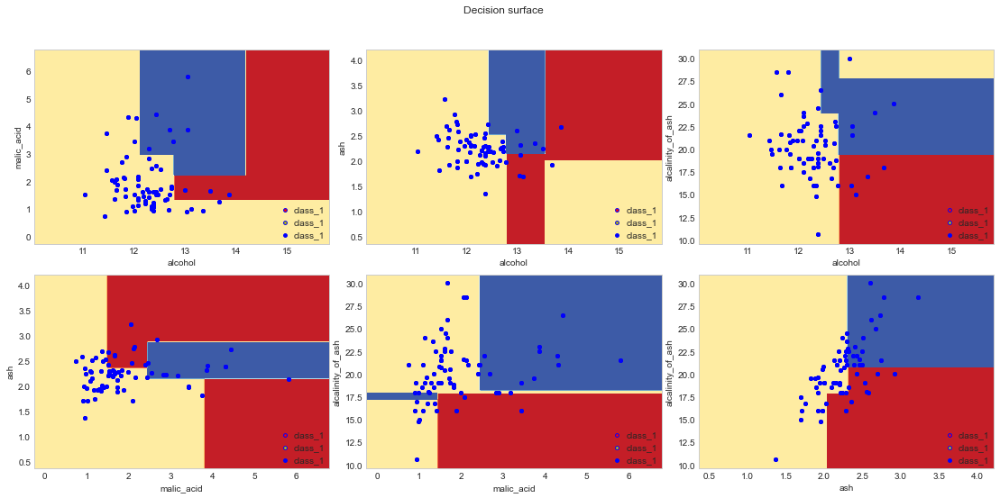

In [62]:
plt.figure(figsize=(16, 8))
for pairidx, pair in enumerate([[0, 1], [0, 2], [0, 3],
                                [1, 2], [1, 3], [2, 3]]):
    X = wine.data[:, pair]
    y = wine.target
    
    model = DecisionTreeClassifier(max_depth=3) # Generalization
    model = model.fit(X, y)
    
    plt.subplot(2, 3, pairidx+1)
    
    x_min, x_max = X[:, 0].min()-1, X[:, 0].max()+1
    y_min, y_max = X[:, 1].min()-1, X[:, 1].max()+1
    
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)
    
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)
    
    plt.xlabel(wine.feature_names[pair[0]])
    plt.ylabel(wine.feature_names[pair[1]])
    
    for i, color in zip(range(n_classes), plot_colors):
        idx= np.where(y==1)
        plt.scatter(X[idx, 0], X[idx, 1], c=color, label=wine.target_names[1],
                    cmap=plt.cm.RdYlBu, edgecolors='b', s=15)
        
    plt.suptitle('Decision surface')
    plt.legend(loc='lower right', borderpad=0, handletextpad=0)
    plt.axis('tight')

#### Breast cancer

In [64]:
model = DecisionTreeClassifier()

In [65]:
cross_val_score(model,
                X=cancer.data, y=cancer.target,
                cv=5,
                n_jobs=multiprocessing.cpu_count())

array([0.9122807 , 0.92982456, 0.92982456, 0.94736842, 0.88495575])

In [66]:
# After preprocessing

model = make_pipeline(StandardScaler(),
                      DecisionTreeClassifier())

In [67]:
cross_val_score(model,
                X=cancer.data, y=cancer.target,
                cv=5,
                n_jobs=multiprocessing.cpu_count())

array([0.9122807 , 0.90350877, 0.92105263, 0.93859649, 0.88495575])

In [68]:
# Visualization 
model = DecisionTreeClassifier()
model.fit(cancer.data, cancer.target)

DecisionTreeClassifier()

In [72]:
r = tree.export_text(decision_tree=model,
                     feature_names=list(cancer.feature_names))
print(r)

|--- worst radius <= 16.80
|   |--- worst concave points <= 0.14
|   |   |--- worst fractal dimension <= 0.06
|   |   |   |--- class: 0
|   |   |--- worst fractal dimension >  0.06
|   |   |   |--- area error <= 38.60
|   |   |   |   |--- smoothness error <= 0.00
|   |   |   |   |   |--- fractal dimension error <= 0.00
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- fractal dimension error >  0.00
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- smoothness error >  0.00
|   |   |   |   |   |--- worst texture <= 33.27
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- worst texture >  33.27
|   |   |   |   |   |   |--- worst texture <= 33.56
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- worst texture >  33.56
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |--- area error >  38.60
|   |   |   |   |--- symmetry error <= 0.02
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- symmetry error >  0.02
|   |   |   |   |  

[Text(0.609375, 0.9375, 'X[20] <= 16.795\ngini = 0.468\nsamples = 569\nvalue = [212, 357]'),
 Text(0.375, 0.8125, 'X[27] <= 0.136\ngini = 0.159\nsamples = 379\nvalue = [33, 346]'),
 Text(0.171875, 0.6875, 'X[29] <= 0.055\ngini = 0.03\nsamples = 333\nvalue = [5, 328]'),
 Text(0.140625, 0.5625, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(0.203125, 0.5625, 'X[13] <= 38.605\ngini = 0.024\nsamples = 332\nvalue = [4, 328]'),
 Text(0.125, 0.4375, 'X[14] <= 0.003\ngini = 0.012\nsamples = 319\nvalue = [2, 317]'),
 Text(0.0625, 0.3125, 'X[19] <= 0.001\ngini = 0.245\nsamples = 7\nvalue = [1, 6]'),
 Text(0.03125, 0.1875, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(0.09375, 0.1875, 'gini = 0.0\nsamples = 6\nvalue = [0, 6]'),
 Text(0.1875, 0.3125, 'X[21] <= 33.27\ngini = 0.006\nsamples = 312\nvalue = [1, 311]'),
 Text(0.15625, 0.1875, 'gini = 0.0\nsamples = 292\nvalue = [0, 292]'),
 Text(0.21875, 0.1875, 'X[21] <= 33.56\ngini = 0.095\nsamples = 20\nvalue = [1, 19]'),
 Text(0.1875, 0.0625

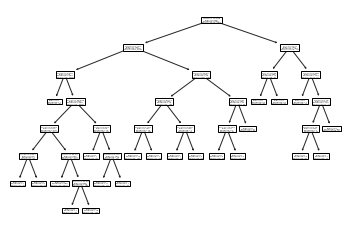

In [73]:
tree.plot_tree(model)

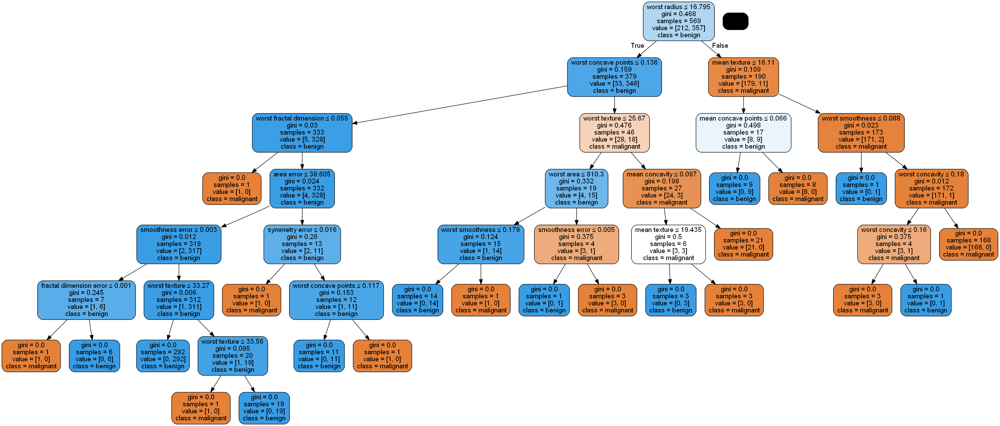

In [74]:
dot_data = tree.export_graphviz(decision_tree=model,
                                feature_names=cancer.feature_names,
                                class_names=cancer.target_names,
                                filled=True, rounded=True,
                                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [79]:
n_classes = 2
plot_colors = 'ryb'
plot_step = 0.02

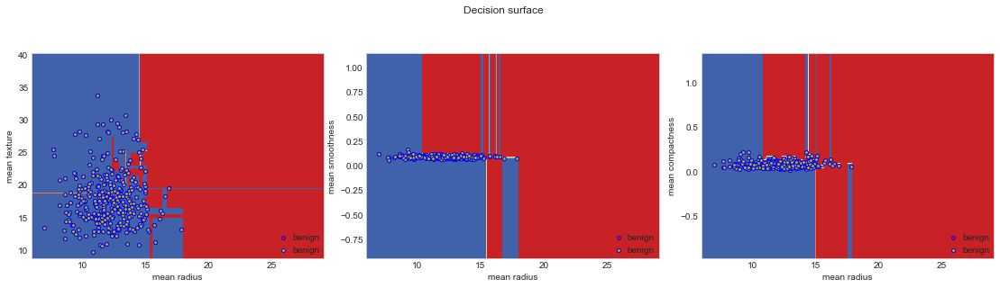

In [85]:
plt.figure(figsize=(16, 8))
for pairidx, pair in enumerate([[0, 1], [0, 4], [0, 5]]):
    X = cancer.data[:, pair]
    y = cancer.target
    
    model = DecisionTreeClassifier()
    model = model.fit(X, y)
    
    plt.subplot(2, 3, pairidx+1)
    
    x_min, x_max = X[:, 0].min()-1, X[:, 0].max()+1
    y_min, y_max = X[:, 1].min()-1, X[:, 1].max()+1
    
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)
    
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)
    
    plt.xlabel(cancer.feature_names[pair[0]])
    plt.ylabel(cancer.feature_names[pair[1]])
    
    for i, color in zip(range(n_classes), plot_colors):
        idx= np.where(y== 1)
        plt.scatter(X[idx, 0], X[idx, 1], c=color, label=cancer.target_names[1],
                    cmap=plt.cm.RdYlBu, edgecolors='b', s=15)
        
    plt.suptitle('Decision surface')
    plt.legend(loc='lower right', borderpad=0, handletextpad=0)
    plt.axis('tight')

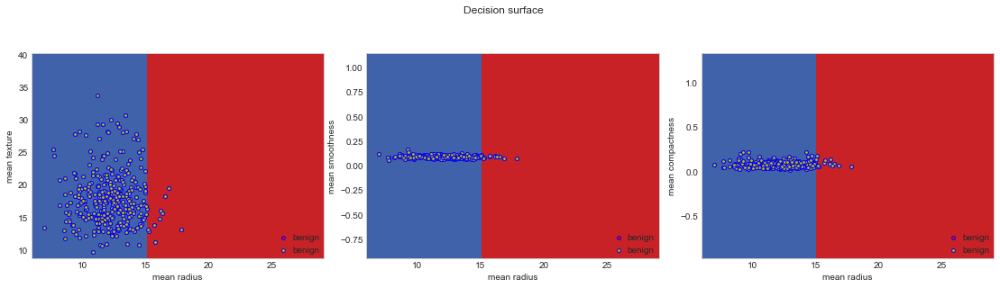

In [84]:
plt.figure(figsize=(16, 8))
for pairidx, pair in enumerate([[0, 1], [0, 4], [0, 5]]):
    X = cancer.data[:, pair]
    y = cancer.target
    
    model = DecisionTreeClassifier(max_depth=2) # Generalization
    model = model.fit(X, y)
    
    plt.subplot(2, 3, pairidx+1)
    
    x_min, x_max = X[:, 0].min()-1, X[:, 0].max()+1
    y_min, y_max = X[:, 1].min()-1, X[:, 1].max()+1
    
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)
    
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)
    
    plt.xlabel(cancer.feature_names[pair[0]])
    plt.ylabel(cancer.feature_names[pair[1]])
    
    for i, color in zip(range(n_classes), plot_colors):
        idx= np.where(y==1)
        plt.scatter(X[idx, 0], X[idx, 1], c=color, label=cancer.target_names[1],
                    cmap=plt.cm.RdYlBu, edgecolors='b', s=15)
        
    plt.suptitle('Decision surface')
    plt.legend(loc='lower right', borderpad=0, handletextpad=0)
    plt.axis('tight')

In [86]:
model = DecisionTreeRegressor()

In [87]:
cross_val_score(
    estimator=model,
    X=boston.data, y=boston.target,
    cv=5,
    n_jobs=multiprocessing.cpu_count())

array([ 0.68326713,  0.61094703,  0.65558582,  0.43471292, -1.40271168])

In [88]:
model = make_pipeline(
    StandardScaler(),
    DecisionTreeRegressor())

In [89]:
cross_val_score(
    estimator=model,
    X=boston.data, y=boston.target,
    cv=5,
    n_jobs=multiprocessing.cpu_count())

array([ 0.63295472,  0.42787877,  0.61400367,  0.39557148, -1.79275123])

In [92]:
model = DecisionTreeRegressor()
model.fit(boston.data, boston.target)

DecisionTreeRegressor()

In [93]:
print(tree.export_text(model))

|--- feature_5 <= 6.94
|   |--- feature_12 <= 14.40
|   |   |--- feature_7 <= 1.38
|   |   |   |--- feature_11 <= 339.99
|   |   |   |   |--- value: [27.90]
|   |   |   |--- feature_11 >  339.99
|   |   |   |   |--- value: [50.00]
|   |   |--- feature_7 >  1.38
|   |   |   |--- feature_5 <= 6.54
|   |   |   |   |--- feature_12 <= 7.57
|   |   |   |   |   |--- feature_9 <= 222.50
|   |   |   |   |   |   |--- value: [28.70]
|   |   |   |   |   |--- feature_9 >  222.50
|   |   |   |   |   |   |--- feature_2 <= 5.48
|   |   |   |   |   |   |   |--- feature_10 <= 19.95
|   |   |   |   |   |   |   |   |--- feature_11 <= 393.33
|   |   |   |   |   |   |   |   |   |--- feature_2 <= 3.90
|   |   |   |   |   |   |   |   |   |   |--- feature_9 <= 336.50
|   |   |   |   |   |   |   |   |   |   |   |--- value: [21.90]
|   |   |   |   |   |   |   |   |   |   |--- feature_9 >  336.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |--- 

[Text(0.6811815074984116, 0.975, 'X[5] <= 6.941\nsquared_error = 84.42\nsamples = 506\nvalue = 22.533'), Text(0.4260038421687269, 0.925, 'X[12] <= 14.4\nsquared_error = 40.273\nsamples = 430\nvalue = 19.934'), Text(0.18696681673116913, 0.875, 'X[7] <= 1.385\nsquared_error = 26.009\nsamples = 255\nvalue = 23.35'), Text(0.104283697724122, 0.825, 'X[11] <= 339.985\nsquared_error = 78.146\nsamples = 5\nvalue = 45.58'), Text(0.10243526888863216, 0.775, 'squared_error = 0.0\nsamples = 1\nvalue = 27.9'), Text(0.10613212655961184, 0.775, 'squared_error = 0.0\nsamples = 4\nvalue = 50.0'), Text(0.2696499357382163, 0.825, 'X[5] <= 6.543\nsquared_error = 14.885\nsamples = 250\nvalue = 22.905'), Text(0.1098289842305915, 0.775, 'X[12] <= 7.57\nsquared_error = 8.39\nsamples = 195\nvalue = 21.63'), Text(0.039943391866913126, 0.725, 'X[9] <= 222.5\nsquared_error = 3.015\nsamples = 43\nvalue = 23.97'), Text(0.03809496303142329, 0.675, 'squared_error = 0.0\nsamples = 1\nvalue = 28.7'), Text(0.04179182070

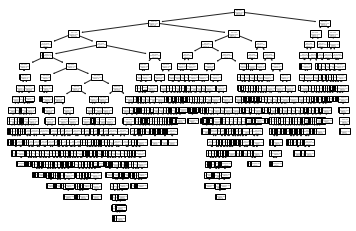

In [94]:
tree.plot_tree(model)

In [96]:
dot_data = tree.export_graphviz(decision_tree=model,
                                feature_names=boston.feature_names,
                                filled=True, rounded=True,
                                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.710288 to fit



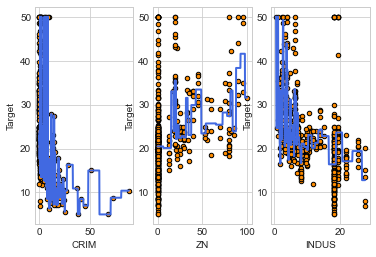

In [99]:
for pairidx, pair in enumerate([0, 1, 2]):
    X = boston.data[:, pair].reshape(-1, 1)
    y = boston.target
    
    model = DecisionTreeRegressor()
    model.fit(X, y)
    
    X_test = np.arange(min(X), max(X), 0.1)[:, np.newaxis]
    predict = model.predict(X_test)
    
    plt.subplot(1, 3, pairidx+1)
    plt.scatter(X, y, s=20, edgecolors='k',
                c='darkorange', label='data')
    
    plt.plot(X_test, predict, color='royalblue', linewidth=2)
    plt.xlabel(boston.feature_names[pair])
    plt.ylabel('Target')

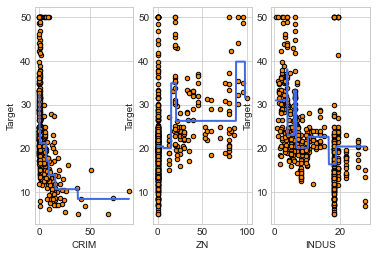

In [100]:
for pairidx, pair in enumerate([0, 1, 2]):
    X = boston.data[:, pair].reshape(-1, 1)
    y = boston.target
    
    model = DecisionTreeRegressor(max_depth=3)
    model.fit(X, y)
    
    X_test = np.arange(min(X), max(X), 0.1)[:, np.newaxis]
    predict = model.predict(X_test)
    
    plt.subplot(1, 3, pairidx+1)
    plt.scatter(X, y, s=20, edgecolors='k',
                c='darkorange', label='data')
    
    plt.plot(X_test, predict, color='royalblue', linewidth=2)
    plt.xlabel(boston.feature_names[pair])
    plt.ylabel('Target')

#### Diabetes

In [117]:
model = DecisionTreeRegressor(max_depth=4)

In [118]:
cross_val_score(
    estimator=model,
    X=diabetes.data, y=diabetes.target,
    cv=5,
    n_jobs=multiprocessing.cpu_count())

array([0.30188617, 0.38369151, 0.30823477, 0.12686226, 0.28968958])

In [119]:
model = DecisionTreeRegressor()
model.fit(diabetes.data, diabetes.target)

DecisionTreeRegressor()

In [120]:
print(tree.export_text(model))

|--- feature_8 <= -0.00
|   |--- feature_2 <= 0.01
|   |   |--- feature_6 <= 0.02
|   |   |   |--- feature_5 <= 0.09
|   |   |   |   |--- feature_1 <= 0.00
|   |   |   |   |   |--- feature_3 <= -0.03
|   |   |   |   |   |   |--- feature_0 <= -0.05
|   |   |   |   |   |   |   |--- feature_3 <= -0.09
|   |   |   |   |   |   |   |   |--- value: [55.00]
|   |   |   |   |   |   |   |--- feature_3 >  -0.09
|   |   |   |   |   |   |   |   |--- feature_3 <= -0.05
|   |   |   |   |   |   |   |   |   |--- feature_3 <= -0.07
|   |   |   |   |   |   |   |   |   |   |--- value: [200.00]
|   |   |   |   |   |   |   |   |   |--- feature_3 >  -0.07
|   |   |   |   |   |   |   |   |   |   |--- feature_5 <= -0.04
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |   |--- feature_5 >  -0.04
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |--- feature_3 >  -0.05
|   |   |   |   |   |

[Text(0.5313817107371794, 0.9761904761904762, 'X[8] <= -0.004\nsquared_error = 5929.885\nsamples = 442\nvalue = 152.133'),
 Text(0.3039923878205128, 0.9285714285714286, 'X[2] <= 0.006\nsquared_error = 3240.821\nsamples = 218\nvalue = 109.986'),
 Text(0.20532451923076922, 0.8809523809523809, 'X[6] <= 0.021\nsquared_error = 2143.968\nsamples = 171\nvalue = 96.31'),
 Text(0.11432692307692308, 0.8333333333333334, 'X[5] <= 0.091\nsquared_error = 2856.847\nsamples = 87\nvalue = 108.805'),
 Text(0.0883974358974359, 0.7857142857142857, 'X[1] <= 0.003\nsquared_error = 2496.899\nsamples = 85\nvalue = 105.682'),
 Text(0.04269230769230769, 0.7380952380952381, 'X[3] <= -0.035\nsquared_error = 2955.72\nsamples = 39\nvalue = 118.846'),
 Text(0.02358974358974359, 0.6904761904761905, 'X[0] <= -0.051\nsquared_error = 2357.959\nsamples = 21\nvalue = 100.429'),
 Text(0.008205128205128205, 0.6428571428571429, 'X[3] <= -0.092\nsquared_error = 2049.0\nsamples = 8\nvalue = 133.5'),
 Text(0.006153846153846154,

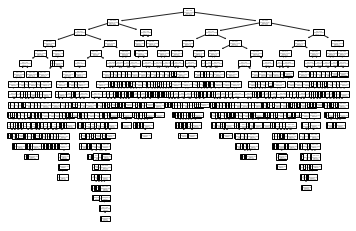

In [121]:
tree.plot_tree(model)

In [106]:
dot_data = tree.export_graphviz(decision_tree=model,
                                feature_names=diabetes.feature_names,
                                filled=True, rounded=True,
                                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.835296 to fit



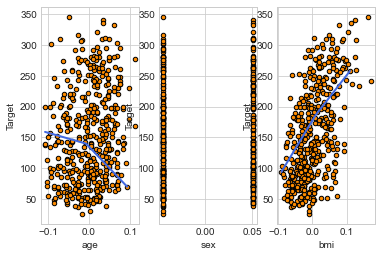

In [107]:
for pairidx, pair in enumerate([0, 1, 2]):
    X = diabetes.data[:, pair].reshape(-1, 1)
    y = diabetes.target
    
    model = DecisionTreeRegressor()
    model.fit(X, y)
    
    X_test = np.arange(min(X), max(X), 0.1)[:, np.newaxis]
    predict = model.predict(X_test)
    
    plt.subplot(1, 3, pairidx+1)
    plt.scatter(X, y, s=20, edgecolors='k',
                c='darkorange', label='data')
    
    plt.plot(X_test, predict, color='royalblue', linewidth=2)
    plt.xlabel(diabetes.feature_names[pair])
    plt.ylabel('Target')

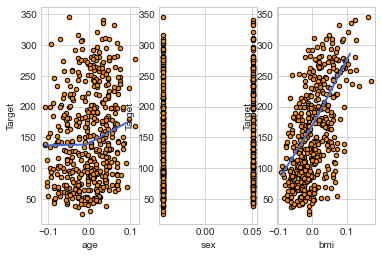

In [108]:
for pairidx, pair in enumerate([0, 1, 2]):
    X = diabetes.data[:, pair].reshape(-1, 1)
    y = diabetes.target
    
    model = DecisionTreeRegressor(max_depth=3)
    model.fit(X, y)
    
    X_test = np.arange(min(X), max(X), 0.1)[:, np.newaxis]
    predict = model.predict(X_test)
    
    plt.subplot(1, 3, pairidx+1)
    plt.scatter(X, y, s=20, edgecolors='k',
                c='darkorange', label='data')
    
    plt.plot(X_test, predict, color='royalblue', linewidth=2)
    plt.xlabel(diabetes.feature_names[pair])
    plt.ylabel('Target')

Decision Tree worked better at classification task in these experiments. One of the biggest strength of Decision Tree is that it is easily interpretable and understandable by human unlike other machine learning methods. Also the visualization of the rules and decision boundaries is easier than other techniques.  